# Deep Convolutional WGANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

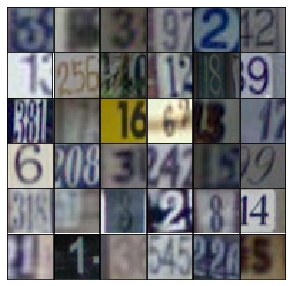

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)): # tanh
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range (-1, 1)
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    input_gen = generator(input_z, output_dim, alpha=alpha)
    Q = discriminator(input_real, alpha=alpha)
    q = discriminator(input_gen, alpha=alpha, reuse=True)
    d_loss = tf.reduce_mean(q-Q) 
    g_loss = tf.reduce_mean(-q)

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z, real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))
                
                if len(x) != batch_size:
                    print(batch_z.shape, x.shape)
                    
                else:
                    # Run optimizers
                    dloss, _ = sess.run([net.d_loss, net.d_opt], feed_dict={net.input_real: x, net.input_z: batch_z})
                    gloss, _ = sess.run([net.g_loss, net.g_opt], feed_dict={net.input_real: x, net.input_z: batch_z})

                    steps += 1
                    if steps % print_every == 0:
                        print("Epoch {}/{}...".format(e+1, epochs),
                              "Dloss: {:.4f}".format(dloss),
                              "Gloss: {:.4f}".format(gloss))
                        # Save losses to view after training
                        losses.append((dloss, gloss))

                    if steps % show_every == 0:
                        gen_samples = sess.run(
                                       generator(net.input_z, 3, reuse=True, training=False),
                                       feed_dict={net.input_z: sample_z})
                        samples.append(gen_samples)
                        _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                        plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

        with open('samples.pkl', 'wb') as f:
            pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [16]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 100
alpha = 0.2
beta1 = 0.5

tf.reset_default_graph()

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

dataset = Dataset(trainset, testset)

Epoch 1/100... Dloss: -2.6418 Gloss: 3.5004
Epoch 1/100... Dloss: -16.5575 Gloss: 17.3734
Epoch 1/100... Dloss: -37.2534 Gloss: 30.9692
Epoch 1/100... Dloss: -60.8569 Gloss: 40.5956
Epoch 1/100... Dloss: -63.0567 Gloss: 43.2719
Epoch 1/100... Dloss: -68.7440 Gloss: 44.7385
Epoch 1/100... Dloss: -17.7052 Gloss: 20.7799
Epoch 1/100... Dloss: -38.4678 Gloss: 39.3980
Epoch 1/100... Dloss: -63.9617 Gloss: 44.0919
Epoch 1/100... Dloss: -84.8851 Gloss: 52.7916


/home/arasdar/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:1324: MatplotlibDeprecationWarning: 
box-forced
  "2.2", "box-forced", obj_type="keyword argument")


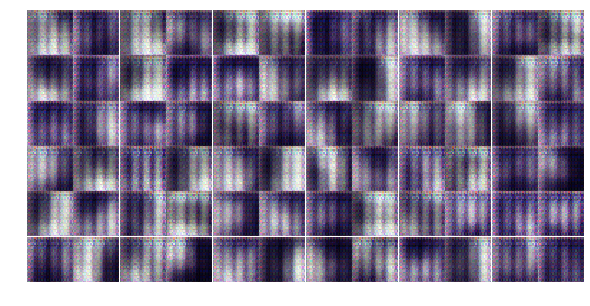

Epoch 1/100... Dloss: -95.2728 Gloss: 51.5110
Epoch 1/100... Dloss: -129.6245 Gloss: 71.5235
Epoch 1/100... Dloss: -77.3203 Gloss: 43.2098
Epoch 1/100... Dloss: -95.6064 Gloss: 59.1763
Epoch 1/100... Dloss: -30.8305 Gloss: 53.4239
Epoch 1/100... Dloss: -107.7594 Gloss: 56.3328
Epoch 1/100... Dloss: -98.0346 Gloss: 68.5627
Epoch 1/100... Dloss: -77.2025 Gloss: 58.8477
Epoch 1/100... Dloss: -68.8059 Gloss: 64.6472
Epoch 1/100... Dloss: -66.3964 Gloss: 41.3598


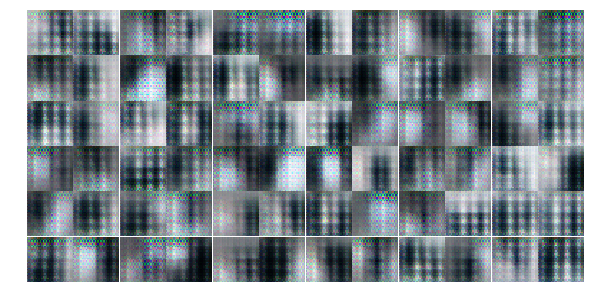

Epoch 1/100... Dloss: -87.8241 Gloss: 64.0485
Epoch 1/100... Dloss: -114.1241 Gloss: 86.3190
Epoch 1/100... Dloss: -100.3136 Gloss: 65.0452
Epoch 1/100... Dloss: -79.3332 Gloss: 74.4519
Epoch 1/100... Dloss: -80.5921 Gloss: 69.7278
Epoch 1/100... Dloss: -126.0427 Gloss: 86.9054
Epoch 1/100... Dloss: -127.1003 Gloss: 84.3166
Epoch 1/100... Dloss: -131.6422 Gloss: 109.0367
Epoch 1/100... Dloss: -65.4563 Gloss: 73.8234
Epoch 1/100... Dloss: -114.1775 Gloss: 85.8775


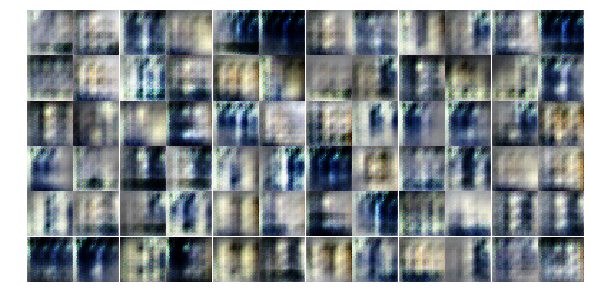

Epoch 1/100... Dloss: -91.6324 Gloss: 85.8746
Epoch 1/100... Dloss: -86.9933 Gloss: 37.6073
Epoch 1/100... Dloss: -104.6581 Gloss: 77.8903
Epoch 1/100... Dloss: -253.6801 Gloss: 122.3512
Epoch 1/100... Dloss: -107.0227 Gloss: 109.9543
Epoch 1/100... Dloss: -238.2765 Gloss: 126.0744
Epoch 1/100... Dloss: -171.4189 Gloss: 114.2054
Epoch 1/100... Dloss: -106.4733 Gloss: 77.6075
Epoch 1/100... Dloss: -192.3238 Gloss: 63.9188
Epoch 1/100... Dloss: -84.0230 Gloss: 55.4760


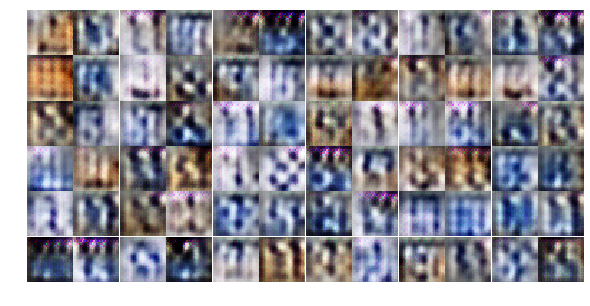

Epoch 1/100... Dloss: -44.0527 Gloss: 28.1304
Epoch 1/100... Dloss: -57.9389 Gloss: 69.9177
Epoch 1/100... Dloss: -133.7469 Gloss: 119.6426
Epoch 1/100... Dloss: -217.8546 Gloss: 116.5947
Epoch 1/100... Dloss: 41.4621 Gloss: 84.8066
Epoch 1/100... Dloss: -58.2673 Gloss: 66.5449
Epoch 1/100... Dloss: -13.2816 Gloss: 19.5494
Epoch 1/100... Dloss: -86.4519 Gloss: 76.4170
Epoch 1/100... Dloss: -12.3284 Gloss: 58.5510
Epoch 1/100... Dloss: -24.4101 Gloss: -38.7112


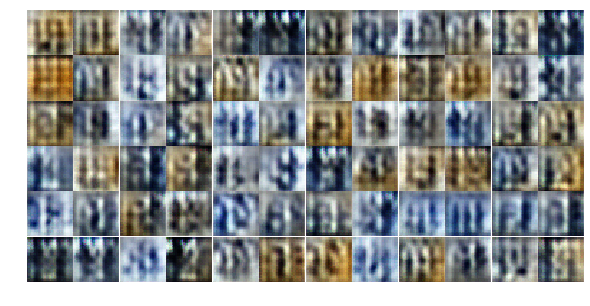

Epoch 1/100... Dloss: -82.9773 Gloss: 97.7823
Epoch 1/100... Dloss: -33.1412 Gloss: 94.4105
Epoch 1/100... Dloss: -27.9902 Gloss: 14.0817
Epoch 1/100... Dloss: -31.8526 Gloss: 72.5561
Epoch 1/100... Dloss: -222.5113 Gloss: 114.9066
Epoch 1/100... Dloss: 33.7642 Gloss: -44.0188
Epoch 1/100... Dloss: -130.2654 Gloss: 88.3231
(128, 100) (41, 32, 32, 3)
Epoch 2/100... Dloss: -5.7821 Gloss: 82.5058
Epoch 2/100... Dloss: -48.9948 Gloss: 94.1777
Epoch 2/100... Dloss: -79.5547 Gloss: 47.4230


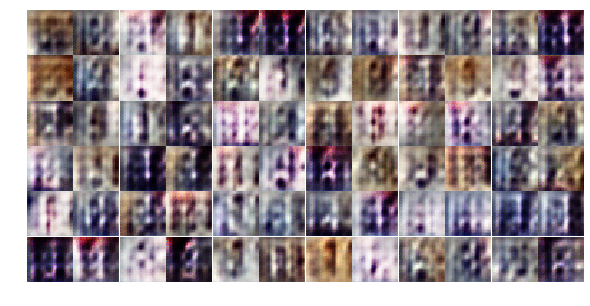

Epoch 2/100... Dloss: -1.0185 Gloss: -71.9862
Epoch 2/100... Dloss: -50.4935 Gloss: 62.4285
Epoch 2/100... Dloss: 67.3113 Gloss: 36.3665
Epoch 2/100... Dloss: -109.9829 Gloss: 88.4258
Epoch 2/100... Dloss: -14.4811 Gloss: 50.1160
Epoch 2/100... Dloss: -56.2288 Gloss: 103.6833
Epoch 2/100... Dloss: -19.1888 Gloss: -14.6958
Epoch 2/100... Dloss: -7.1846 Gloss: -44.8286
Epoch 2/100... Dloss: 9.0709 Gloss: -95.6203
Epoch 2/100... Dloss: -36.6637 Gloss: -32.4979


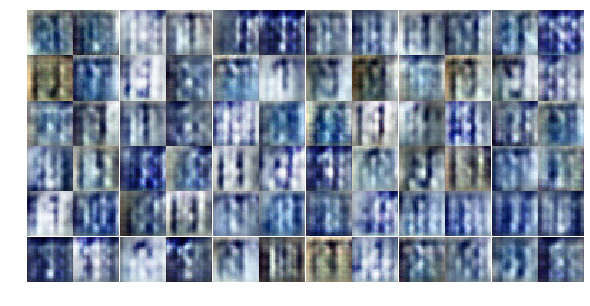

Epoch 2/100... Dloss: -14.9875 Gloss: 6.5691
Epoch 2/100... Dloss: -32.9351 Gloss: 73.7835
Epoch 2/100... Dloss: -44.1651 Gloss: 96.9961
Epoch 2/100... Dloss: -5.9927 Gloss: 53.4657
Epoch 2/100... Dloss: -43.0202 Gloss: 66.6455
Epoch 2/100... Dloss: -9.0464 Gloss: 131.3151
Epoch 2/100... Dloss: -44.3352 Gloss: 56.7844
Epoch 2/100... Dloss: -29.6740 Gloss: 105.3859
Epoch 2/100... Dloss: -54.4365 Gloss: 67.0983
Epoch 2/100... Dloss: -89.4951 Gloss: 78.0114


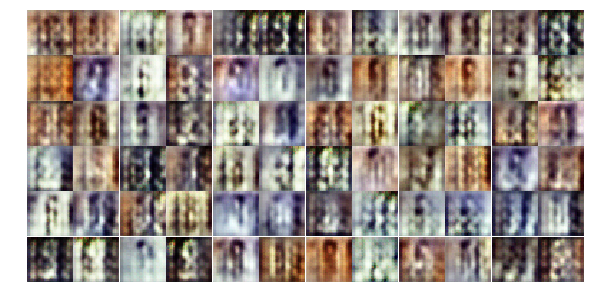

Epoch 2/100... Dloss: -29.0574 Gloss: 57.3886
Epoch 2/100... Dloss: 24.7467 Gloss: 34.3198
Epoch 2/100... Dloss: -28.9323 Gloss: 49.6420
Epoch 2/100... Dloss: -73.2264 Gloss: 89.3059
Epoch 2/100... Dloss: 3.2657 Gloss: 89.3004
Epoch 2/100... Dloss: -26.6222 Gloss: 16.1155
Epoch 2/100... Dloss: -6.4333 Gloss: 29.2559
Epoch 2/100... Dloss: -61.4879 Gloss: 107.4891
Epoch 2/100... Dloss: 6.3426 Gloss: 141.8416
Epoch 2/100... Dloss: -33.5425 Gloss: 83.0733


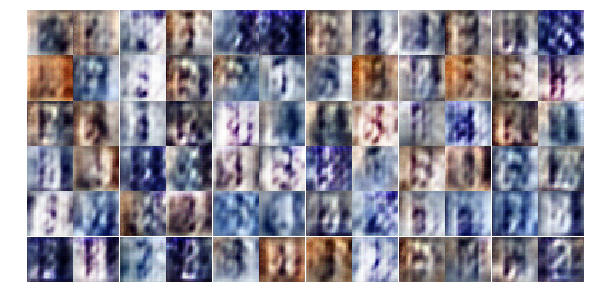

Epoch 2/100... Dloss: -33.0584 Gloss: 123.0534
Epoch 2/100... Dloss: -12.8618 Gloss: 138.9736
Epoch 2/100... Dloss: -5.3525 Gloss: 149.6895
Epoch 2/100... Dloss: -12.6958 Gloss: 20.5124
Epoch 2/100... Dloss: -30.1264 Gloss: 52.6445
Epoch 2/100... Dloss: -77.0225 Gloss: 155.1141
Epoch 2/100... Dloss: 2.8685 Gloss: 100.8874
Epoch 2/100... Dloss: 6.8205 Gloss: 113.3044
Epoch 2/100... Dloss: -19.4314 Gloss: 119.7422
Epoch 2/100... Dloss: -122.8151 Gloss: 111.4021


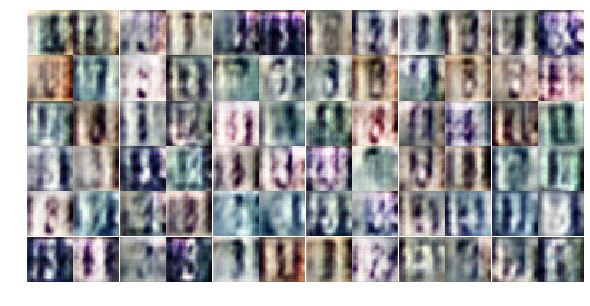

Epoch 2/100... Dloss: 36.5429 Gloss: 30.6854
Epoch 2/100... Dloss: -30.6035 Gloss: 72.3645
Epoch 2/100... Dloss: 8.2808 Gloss: 1.6130
Epoch 2/100... Dloss: -20.7646 Gloss: 39.3716
Epoch 2/100... Dloss: 18.0044 Gloss: -28.7024
Epoch 2/100... Dloss: 2.9756 Gloss: -90.9641
Epoch 2/100... Dloss: -12.6028 Gloss: -39.4752
Epoch 2/100... Dloss: -18.9976 Gloss: 28.4237
Epoch 2/100... Dloss: -0.2908 Gloss: -24.5473
Epoch 2/100... Dloss: -20.9282 Gloss: 24.4345


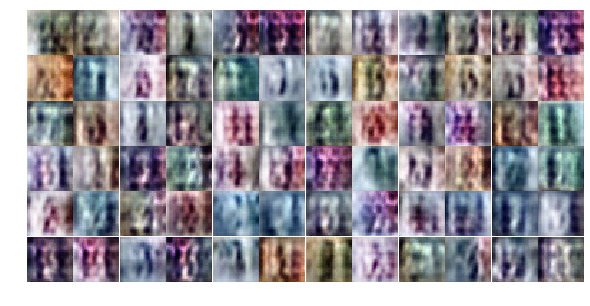

Epoch 2/100... Dloss: 13.7969 Gloss: 40.3396
Epoch 2/100... Dloss: -47.0820 Gloss: 102.7327
Epoch 2/100... Dloss: -18.5526 Gloss: 48.1059
Epoch 2/100... Dloss: -23.1137 Gloss: 40.8925
(128, 100) (41, 32, 32, 3)
Epoch 3/100... Dloss: -17.3218 Gloss: 31.0306
Epoch 3/100... Dloss: -35.4155 Gloss: 58.2219
Epoch 3/100... Dloss: -28.9395 Gloss: 40.3174
Epoch 3/100... Dloss: -63.0258 Gloss: 116.8223
Epoch 3/100... Dloss: -44.1121 Gloss: 94.0748
Epoch 3/100... Dloss: 10.1987 Gloss: 6.0890


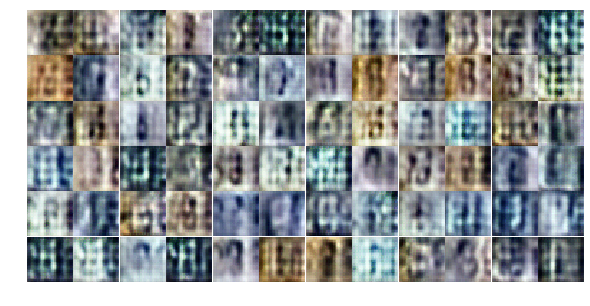

Epoch 3/100... Dloss: -47.1246 Gloss: 95.9820
Epoch 3/100... Dloss: 23.9494 Gloss: 53.4046
Epoch 3/100... Dloss: -18.0200 Gloss: 40.8832
Epoch 3/100... Dloss: -15.9593 Gloss: 24.6936
Epoch 3/100... Dloss: 7.3244 Gloss: 18.6168
Epoch 3/100... Dloss: -21.0480 Gloss: 70.0938
Epoch 3/100... Dloss: -5.7260 Gloss: 88.4632
Epoch 3/100... Dloss: -19.0331 Gloss: -3.7934
Epoch 3/100... Dloss: 11.1896 Gloss: -104.3474
Epoch 3/100... Dloss: -30.1142 Gloss: -36.5055


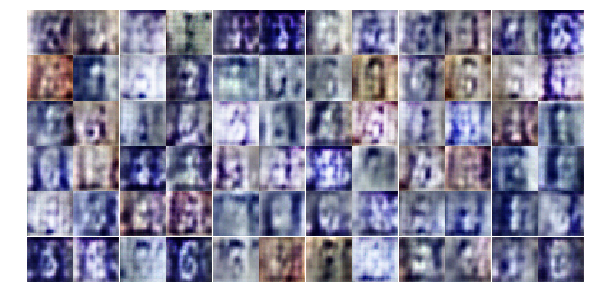

Epoch 3/100... Dloss: -32.6433 Gloss: 50.9856
Epoch 3/100... Dloss: 6.9117 Gloss: -19.6759
Epoch 3/100... Dloss: -10.0487 Gloss: -60.6069
Epoch 3/100... Dloss: -15.9736 Gloss: -0.1020
Epoch 3/100... Dloss: -23.7444 Gloss: 41.9066
Epoch 3/100... Dloss: -6.3328 Gloss: 56.4815
Epoch 3/100... Dloss: 1.6333 Gloss: 18.9565
Epoch 3/100... Dloss: -18.0074 Gloss: 3.4885
Epoch 3/100... Dloss: -7.3680 Gloss: 49.7568
Epoch 3/100... Dloss: 2.8470 Gloss: -29.0298


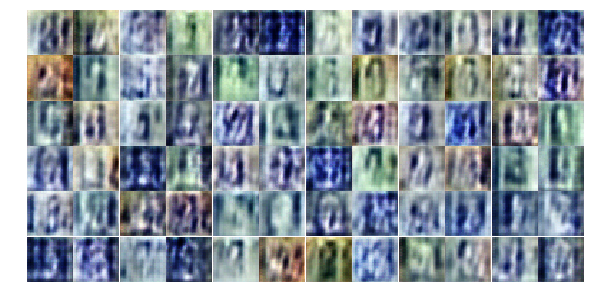

Epoch 3/100... Dloss: -4.8305 Gloss: 49.6497
Epoch 3/100... Dloss: 24.3553 Gloss: 58.4766
Epoch 3/100... Dloss: -41.1483 Gloss: 47.1809
Epoch 3/100... Dloss: -5.7370 Gloss: -29.6344
Epoch 3/100... Dloss: -1.1414 Gloss: -21.0724
Epoch 3/100... Dloss: -57.7226 Gloss: 99.4645
Epoch 3/100... Dloss: 0.5434 Gloss: -24.1505
Epoch 3/100... Dloss: 12.5143 Gloss: -121.4569
Epoch 3/100... Dloss: 10.3409 Gloss: -77.0567
Epoch 3/100... Dloss: -20.8193 Gloss: -53.1805


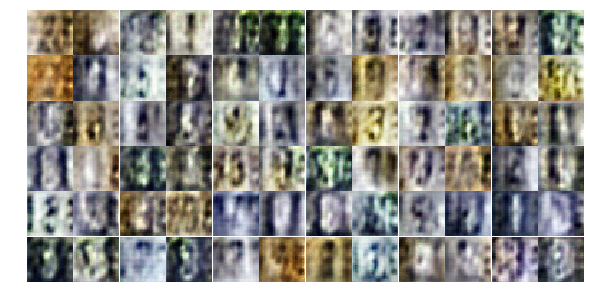

Epoch 3/100... Dloss: -29.2467 Gloss: -23.0261
Epoch 3/100... Dloss: 5.4329 Gloss: 7.3111
Epoch 3/100... Dloss: -17.1704 Gloss: 32.2810
Epoch 3/100... Dloss: -31.6770 Gloss: 32.3213
Epoch 3/100... Dloss: -6.7361 Gloss: 11.8084
Epoch 3/100... Dloss: -20.1840 Gloss: 48.4702
Epoch 3/100... Dloss: -23.7126 Gloss: 49.7216
Epoch 3/100... Dloss: -2.2306 Gloss: -5.4441
Epoch 3/100... Dloss: -3.2375 Gloss: -10.6092
Epoch 3/100... Dloss: -23.2144 Gloss: 26.5698


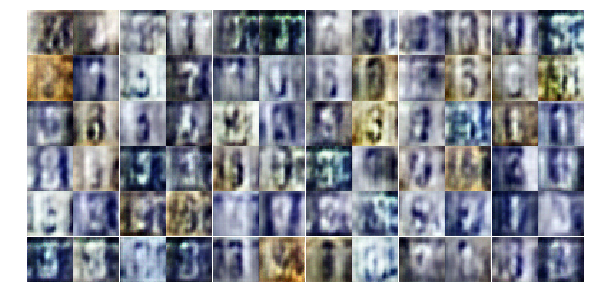

Epoch 3/100... Dloss: -22.5409 Gloss: -1.3283
Epoch 3/100... Dloss: -0.2077 Gloss: 7.7591
Epoch 3/100... Dloss: -22.9881 Gloss: 17.0833
Epoch 3/100... Dloss: -9.2092 Gloss: 40.2557
Epoch 3/100... Dloss: -6.3894 Gloss: 38.2880
Epoch 3/100... Dloss: -13.6552 Gloss: 40.6365
Epoch 3/100... Dloss: -0.1806 Gloss: 7.5232
Epoch 3/100... Dloss: -19.5510 Gloss: 14.9311
Epoch 3/100... Dloss: -29.3718 Gloss: 73.6829
Epoch 3/100... Dloss: -32.2344 Gloss: 18.7154


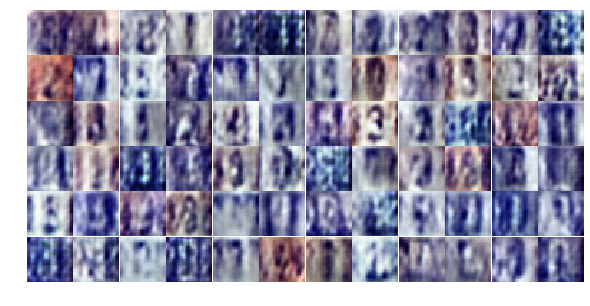

Epoch 3/100... Dloss: 27.1408 Gloss: 15.8233
(128, 100) (41, 32, 32, 3)
Epoch 4/100... Dloss: -14.9051 Gloss: 51.7689
Epoch 4/100... Dloss: -20.0049 Gloss: 71.9113
Epoch 4/100... Dloss: -25.1480 Gloss: 65.4265
Epoch 4/100... Dloss: 39.0445 Gloss: -34.0583
Epoch 4/100... Dloss: -12.0969 Gloss: 31.0330
Epoch 4/100... Dloss: -15.9621 Gloss: 79.2458
Epoch 4/100... Dloss: -16.1159 Gloss: -49.2814
Epoch 4/100... Dloss: -30.6104 Gloss: 21.0061
Epoch 4/100... Dloss: 3.4348 Gloss: 24.4020


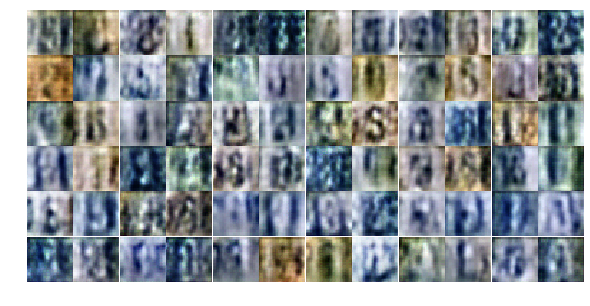

Epoch 4/100... Dloss: -24.4064 Gloss: 38.3074
Epoch 4/100... Dloss: -0.8747 Gloss: 58.6463
Epoch 4/100... Dloss: -30.7328 Gloss: 79.4073
Epoch 4/100... Dloss: -9.8125 Gloss: 44.5656
Epoch 4/100... Dloss: -9.6757 Gloss: 2.3944
Epoch 4/100... Dloss: -4.0099 Gloss: 44.9073
Epoch 4/100... Dloss: 7.8839 Gloss: 27.6909
Epoch 4/100... Dloss: 3.8015 Gloss: -14.0979
Epoch 4/100... Dloss: -16.5934 Gloss: 55.0443
Epoch 4/100... Dloss: 12.7463 Gloss: 68.1189


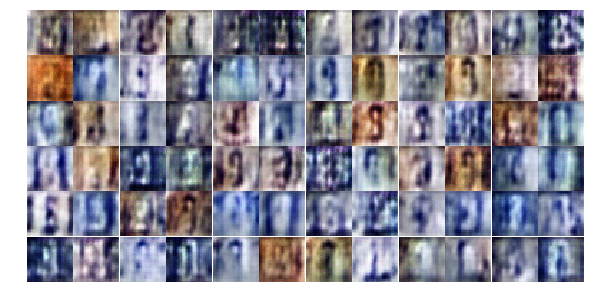

Epoch 4/100... Dloss: -19.2849 Gloss: 49.7982
Epoch 4/100... Dloss: -15.9492 Gloss: 37.8235
Epoch 4/100... Dloss: -19.3405 Gloss: 78.5429
Epoch 4/100... Dloss: -9.1459 Gloss: 70.3559
Epoch 4/100... Dloss: -11.6053 Gloss: 70.7654
Epoch 4/100... Dloss: -27.4418 Gloss: 65.3047
Epoch 4/100... Dloss: 0.9822 Gloss: 39.1914
Epoch 4/100... Dloss: -0.2914 Gloss: 33.2621
Epoch 4/100... Dloss: -30.0239 Gloss: 66.0543
Epoch 4/100... Dloss: -5.0338 Gloss: 57.5896


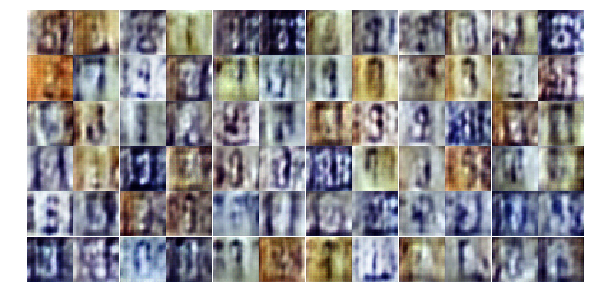

Epoch 4/100... Dloss: -23.2969 Gloss: 47.6390
Epoch 4/100... Dloss: -15.2225 Gloss: 47.1075
Epoch 4/100... Dloss: -10.7987 Gloss: 53.3958
Epoch 4/100... Dloss: -20.2643 Gloss: 40.7175
Epoch 4/100... Dloss: -21.9176 Gloss: 15.0122
Epoch 4/100... Dloss: 22.6211 Gloss: 51.6228
Epoch 4/100... Dloss: -6.6653 Gloss: 51.2991
Epoch 4/100... Dloss: -17.8538 Gloss: 63.3598
Epoch 4/100... Dloss: 4.5100 Gloss: 70.5041
Epoch 4/100... Dloss: -17.9148 Gloss: 82.7035


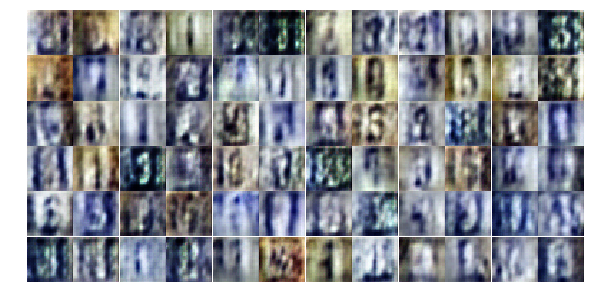

Epoch 4/100... Dloss: -31.9944 Gloss: 92.6505
Epoch 4/100... Dloss: -53.0092 Gloss: 40.6077
Epoch 4/100... Dloss: -87.7581 Gloss: 73.4797
Epoch 4/100... Dloss: -115.3209 Gloss: 116.7346
Epoch 4/100... Dloss: -102.1435 Gloss: 139.5319
Epoch 4/100... Dloss: -81.7966 Gloss: 118.5071
Epoch 4/100... Dloss: 51.2554 Gloss: -116.1462
Epoch 4/100... Dloss: -17.9790 Gloss: 1.6907
Epoch 4/100... Dloss: -23.6282 Gloss: 86.0159
Epoch 4/100... Dloss: 125.0470 Gloss: -29.2607


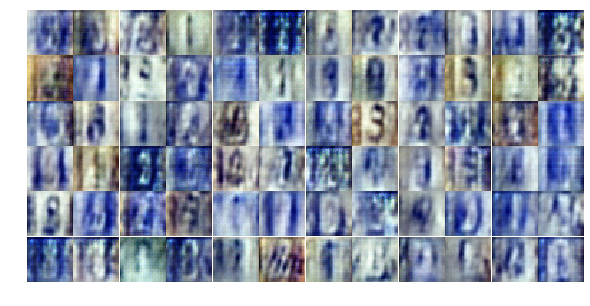

Epoch 4/100... Dloss: -22.2018 Gloss: -5.6179
Epoch 4/100... Dloss: 21.7065 Gloss: -43.9180
Epoch 4/100... Dloss: -23.9061 Gloss: 86.6882
Epoch 4/100... Dloss: -54.2789 Gloss: 121.4765
Epoch 4/100... Dloss: 29.1824 Gloss: 30.6799
Epoch 4/100... Dloss: 10.4463 Gloss: -4.4363
Epoch 4/100... Dloss: -19.4172 Gloss: -35.9928
Epoch 4/100... Dloss: 40.9561 Gloss: -69.7227
(128, 100) (41, 32, 32, 3)
Epoch 5/100... Dloss: 4.8447 Gloss: -31.5063
Epoch 5/100... Dloss: -64.4844 Gloss: 82.8615


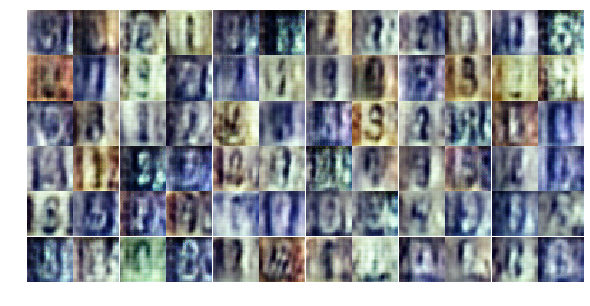

Epoch 5/100... Dloss: -13.3542 Gloss: 53.8922
Epoch 5/100... Dloss: 36.8923 Gloss: 43.7416
Epoch 5/100... Dloss: -0.8068 Gloss: 16.5683
Epoch 5/100... Dloss: -25.2112 Gloss: 37.2110
Epoch 5/100... Dloss: -23.2903 Gloss: 12.0710
Epoch 5/100... Dloss: 12.6747 Gloss: 9.7858
Epoch 5/100... Dloss: -5.9307 Gloss: 39.6862
Epoch 5/100... Dloss: -35.4015 Gloss: 49.1314
Epoch 5/100... Dloss: -19.9931 Gloss: 81.2353
Epoch 5/100... Dloss: -28.7449 Gloss: 55.4802


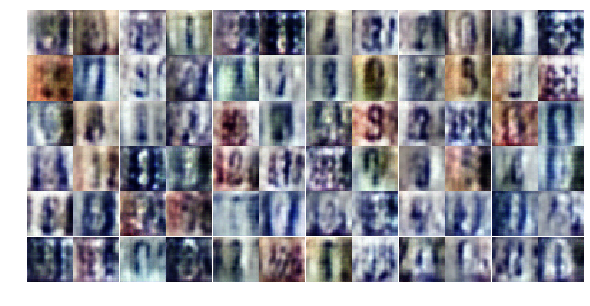

Epoch 5/100... Dloss: 2.8994 Gloss: 22.1492
Epoch 5/100... Dloss: -21.4123 Gloss: 60.5607
Epoch 5/100... Dloss: -26.9614 Gloss: 84.9862
Epoch 5/100... Dloss: -58.3406 Gloss: 90.0046
Epoch 5/100... Dloss: -51.6067 Gloss: 117.3689
Epoch 5/100... Dloss: -104.5706 Gloss: 90.9675
Epoch 5/100... Dloss: 33.8750 Gloss: -37.1638
Epoch 5/100... Dloss: -21.7273 Gloss: 105.0182
Epoch 5/100... Dloss: -21.3980 Gloss: 184.8483
Epoch 5/100... Dloss: -25.1355 Gloss: 186.2997


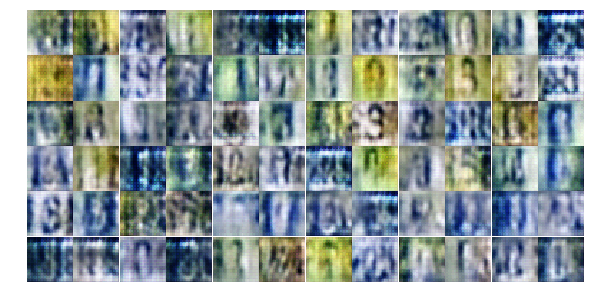

Epoch 5/100... Dloss: -45.7269 Gloss: 103.4406
Epoch 5/100... Dloss: 22.3196 Gloss: -11.0270
Epoch 5/100... Dloss: -45.9030 Gloss: 82.3662
Epoch 5/100... Dloss: -71.6406 Gloss: 94.2276
Epoch 5/100... Dloss: -117.7158 Gloss: 38.8006
Epoch 5/100... Dloss: -38.5193 Gloss: 15.3433
Epoch 5/100... Dloss: -68.9642 Gloss: 90.4450
Epoch 5/100... Dloss: -39.2743 Gloss: 219.3840
Epoch 5/100... Dloss: -7.7667 Gloss: 287.9141
Epoch 5/100... Dloss: -29.0151 Gloss: 288.9468


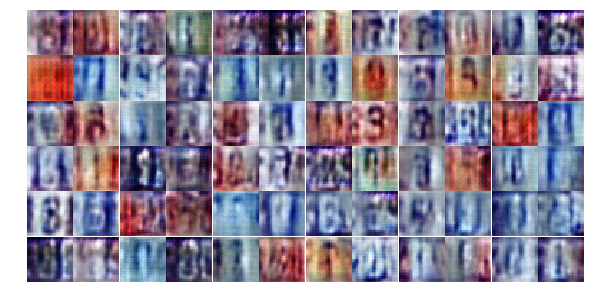

Epoch 5/100... Dloss: -19.2073 Gloss: 251.8723
Epoch 5/100... Dloss: -23.8950 Gloss: 267.1462
Epoch 5/100... Dloss: -11.6346 Gloss: 214.2096
Epoch 5/100... Dloss: 3.2568 Gloss: 168.3806
Epoch 5/100... Dloss: -26.9210 Gloss: 152.9966
Epoch 5/100... Dloss: -16.2422 Gloss: 175.6099
Epoch 5/100... Dloss: 5.6726 Gloss: 205.0814
Epoch 5/100... Dloss: -12.7605 Gloss: 154.4441
Epoch 5/100... Dloss: -29.5794 Gloss: 196.0503
Epoch 5/100... Dloss: -27.1527 Gloss: 185.1548


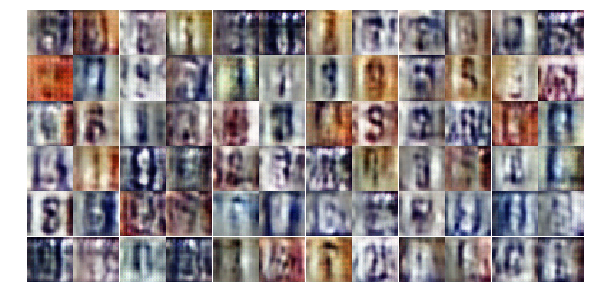

Epoch 5/100... Dloss: 13.6685 Gloss: 26.6077
Epoch 5/100... Dloss: -11.0731 Gloss: 144.9370
Epoch 5/100... Dloss: -22.5712 Gloss: -69.9883
Epoch 5/100... Dloss: -27.1694 Gloss: 132.9582
Epoch 5/100... Dloss: -34.4472 Gloss: 151.9509
Epoch 5/100... Dloss: -31.9141 Gloss: 100.7724
Epoch 5/100... Dloss: 37.4031 Gloss: -11.6211
Epoch 5/100... Dloss: -47.4128 Gloss: 116.6249
Epoch 5/100... Dloss: -60.4143 Gloss: 39.7077
Epoch 5/100... Dloss: 1.0794 Gloss: 186.3811


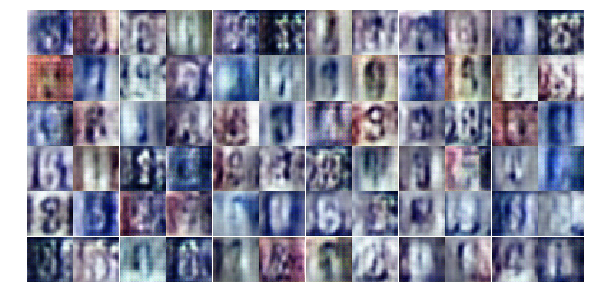

Epoch 5/100... Dloss: -47.0656 Gloss: 151.0949
Epoch 5/100... Dloss: -15.7916 Gloss: 37.3919
Epoch 5/100... Dloss: 17.0995 Gloss: 119.6847
Epoch 5/100... Dloss: -10.6949 Gloss: 150.1454
Epoch 5/100... Dloss: -24.8771 Gloss: 123.8153
Epoch 5/100... Dloss: 0.2505 Gloss: 75.8775
(128, 100) (41, 32, 32, 3)
Epoch 6/100... Dloss: -29.3444 Gloss: 109.0816
Epoch 6/100... Dloss: -20.2038 Gloss: 109.9445
Epoch 6/100... Dloss: -58.1704 Gloss: 50.8420
Epoch 6/100... Dloss: -166.0435 Gloss: 183.2400


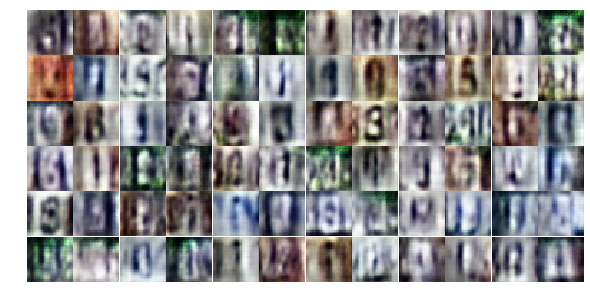

Epoch 6/100... Dloss: -53.9493 Gloss: 224.9642
Epoch 6/100... Dloss: -65.5108 Gloss: 92.5609
Epoch 6/100... Dloss: -92.7514 Gloss: 230.8820
Epoch 6/100... Dloss: -133.4565 Gloss: 204.0874
Epoch 6/100... Dloss: -366.6877 Gloss: 133.0413
Epoch 6/100... Dloss: -249.1383 Gloss: 286.4586
Epoch 6/100... Dloss: -474.3009 Gloss: 201.7014
Epoch 6/100... Dloss: -254.7355 Gloss: 271.7090
Epoch 6/100... Dloss: -16.1003 Gloss: 339.8640
Epoch 6/100... Dloss: -1011.2279 Gloss: 512.5469


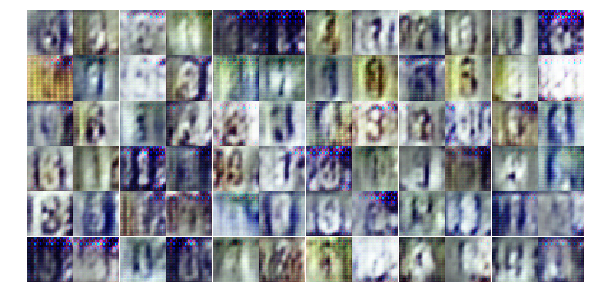

Epoch 6/100... Dloss: -195.1836 Gloss: 430.9304
Epoch 6/100... Dloss: -689.6854 Gloss: 55.8479
Epoch 6/100... Dloss: -271.0898 Gloss: 73.8705
Epoch 6/100... Dloss: 104.4453 Gloss: 226.5969
Epoch 6/100... Dloss: -329.4731 Gloss: 491.9362
Epoch 6/100... Dloss: -33.0236 Gloss: -441.1258
Epoch 6/100... Dloss: -436.3415 Gloss: -19.8861
Epoch 6/100... Dloss: -436.5822 Gloss: 245.4444
Epoch 6/100... Dloss: -467.3764 Gloss: 203.8419
Epoch 6/100... Dloss: -738.1587 Gloss: 601.6204


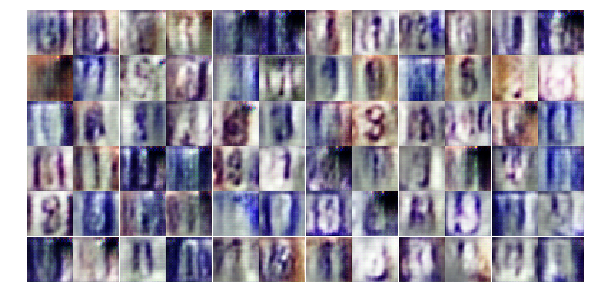

Epoch 6/100... Dloss: -622.3337 Gloss: 499.9489
Epoch 6/100... Dloss: -126.3600 Gloss: 483.6424
Epoch 6/100... Dloss: -1188.7646 Gloss: 627.8365
Epoch 6/100... Dloss: -664.1853 Gloss: 449.4872
Epoch 6/100... Dloss: -642.3664 Gloss: 317.7438
Epoch 6/100... Dloss: -1296.1113 Gloss: 678.7975
Epoch 6/100... Dloss: -395.6036 Gloss: 268.3594
Epoch 6/100... Dloss: -293.3819 Gloss: 162.1223
Epoch 6/100... Dloss: -1383.1287 Gloss: 698.7347
Epoch 6/100... Dloss: -1440.7062 Gloss: 746.9635


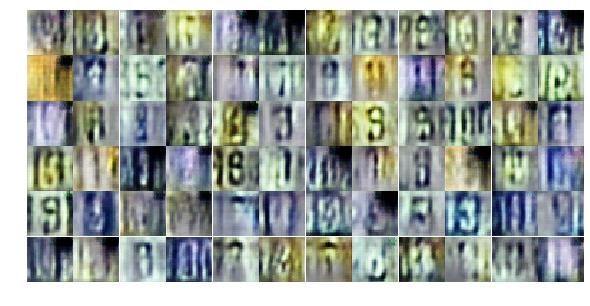

Epoch 6/100... Dloss: -1028.0773 Gloss: 773.7323
Epoch 6/100... Dloss: -1810.2781 Gloss: 870.2344
Epoch 6/100... Dloss: -1926.4963 Gloss: 933.0079
Epoch 6/100... Dloss: -1982.9548 Gloss: 968.7500
Epoch 6/100... Dloss: -2035.9021 Gloss: 989.9310
Epoch 6/100... Dloss: -1669.9901 Gloss: 993.5389
Epoch 6/100... Dloss: -500.1750 Gloss: 550.7480
Epoch 6/100... Dloss: -1837.1399 Gloss: 790.5775
Epoch 6/100... Dloss: -819.6107 Gloss: 970.1129
Epoch 6/100... Dloss: -893.4146 Gloss: 906.9993


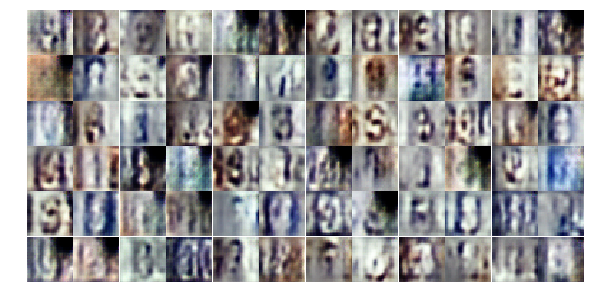

Epoch 6/100... Dloss: -1541.1868 Gloss: 752.2343
Epoch 6/100... Dloss: -2002.2509 Gloss: 1087.6096
Epoch 6/100... Dloss: -1248.6843 Gloss: 178.5636
Epoch 6/100... Dloss: -1154.3846 Gloss: 532.8625
Epoch 6/100... Dloss: -1617.4766 Gloss: 820.1198
Epoch 6/100... Dloss: -1016.4141 Gloss: 212.6295
Epoch 6/100... Dloss: -2438.4041 Gloss: 1191.0940
Epoch 6/100... Dloss: -1339.4662 Gloss: 1101.8787
Epoch 6/100... Dloss: -1319.0424 Gloss: 1056.4508
Epoch 6/100... Dloss: -1145.3699 Gloss: -280.5881


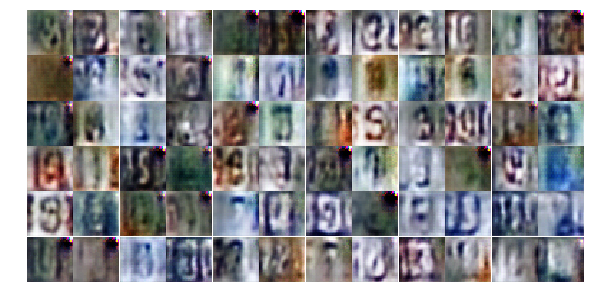

Epoch 6/100... Dloss: -2103.3584 Gloss: 1089.3120
Epoch 6/100... Dloss: -1121.0742 Gloss: 1230.5127
Epoch 6/100... Dloss: -1886.1196 Gloss: 911.4176
(128, 100) (41, 32, 32, 3)
Epoch 7/100... Dloss: -1099.8741 Gloss: 929.4912
Epoch 7/100... Dloss: -2616.2793 Gloss: 1276.0533
Epoch 7/100... Dloss: -2268.5405 Gloss: 1116.5194
Epoch 7/100... Dloss: -2643.0332 Gloss: 1290.5132
Epoch 7/100... Dloss: -1587.8806 Gloss: -24.5425
Epoch 7/100... Dloss: -2514.2468 Gloss: 1136.2281
Epoch 7/100... Dloss: -951.3645 Gloss: 674.3335


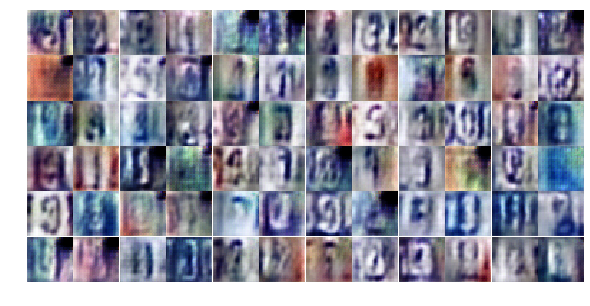

Epoch 7/100... Dloss: -2044.9031 Gloss: 683.3434
Epoch 7/100... Dloss: -2867.7656 Gloss: 1400.9517
Epoch 7/100... Dloss: -2937.3042 Gloss: 1416.3308
Epoch 7/100... Dloss: -962.8804 Gloss: -103.5443
Epoch 7/100... Dloss: -2760.9170 Gloss: 1423.3501
Epoch 7/100... Dloss: -1532.9663 Gloss: 1446.6062
Epoch 7/100... Dloss: -2356.4946 Gloss: 1445.7944
Epoch 7/100... Dloss: -2568.5488 Gloss: 1144.2101


In [ ]:
losses, samples = train(net=net, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

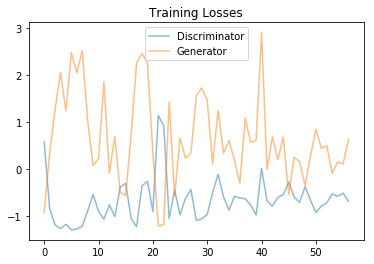

In [22]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

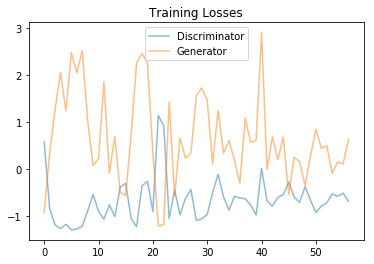

In [23]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


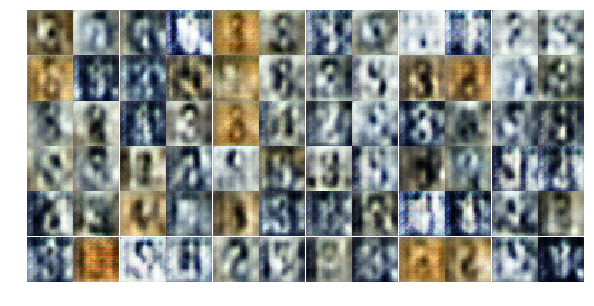

In [24]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

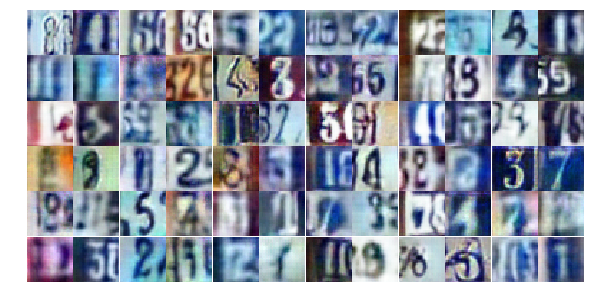

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))